In [1]:
%reload_ext autoreload
%autoreload 0

import os

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('data/df_gebrauchtwagenpreise_2018.csv')
df.describe(include='all')

,Unnamed: 0,model,kw,mark,new,2017,2016,2015,2014,2013,2012,2011
count,7504.000000,7504,7504.000000,7504,7504.000000,3065.000000,2970.000000,3657.000000,3299.000000,3114.000000,2541.000000,1725.000000
unique,NaN,5890,NaN,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,"(II)""",NaN,Mercedes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,22,NaN,760,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3751.500000,NaN,134.340219,NaN,38330.917644,27029.673736,22784.343434,19231.316653,16507.782661,14658.317277,12653.650138,11207.739130
std,2166.362543,NaN,76.685968,NaN,27354.258555,22357.716642,17170.200887,14108.491390,12683.727088,11419.907316,10635.033068,8612.629135
min,0.000000,NaN,4.000000,NaN,6790.000000,5300.000000,4600.000000,4050.000000,3925.000000,3225.000000,2850.000000,2575.000000
25%,1875.750000,NaN,84.000000,NaN,22347.500000,15100.000000,13462.500000,11500.000000,10000.000000,8850.000000,7550.000000,6850.000000
50%,3751.500000,NaN,110.000000,NaN,30800.000000,21000.000000,18200.000000,15400.000000,13100.000000,11550.000000,9950.000000,8900.000000
75%,5627.250000,NaN,151.000000,NaN,43591.500000,30300.000000,25487.500000,21300.000000,18500.000000,16487.500000,14100.000000,12950.000000


# Move to percentages

In [2]:
df.head()

,Unnamed: 0,model,kw,mark,new,2017,2016,2015,2014,2013,2012,2011
0,0,124 Spider (NF ),125,Abarth,33000,26800.0,24950.0,NaN,NaN,NaN,NaN,NaN
1,1,595 Custom (312),103,Abarth,21490,NaN,NaN,13850.0,12550.0,11450.0,NaN,NaN
2,2,595 Competizione (312),132,Abarth,24250,NaN,15500.0,13800.0,NaN,NaN,NaN,NaN
3,3,695 Biposto (312),139,Abarth,39900,28550.0,25450.0,22750.0,20300.0,NaN,NaN,NaN
4,4,595C Custom (312),99,Abarth,20190,NaN,NaN,13000.0,11750.0,10750.0,NaN,NaN


In [3]:
years = [y for y in list(range(2017, 2010, -1))]
years_s = [str(y) for y in years]
years_s_with_new = ['new'] + [str(y) for y in years]

def years_to_percentage(x):
    x[years_s_with_new] = x[years_s_with_new] / x['new']
    return x

df = df.apply(years_to_percentage, axis=1)

# change years to years since
all_years = [max(years) + 1] + years
years_since = [max(all_years) - y for y in all_years]

years_mapping = dict(zip(years_s_with_new, years_since))

print(years_mapping)

df = df.rename(columns=years_mapping)

df.head()

{'new': 0, '2017': 1, '2016': 2, '2015': 3, '2014': 4, '2013': 5, '2012': 6, '2011': 7}


,Unnamed: 0,model,kw,mark,0,1,2,3,4,5,6,7
0,0,124 Spider (NF ),125,Abarth,1.0,0.812121,0.756061,NaN,NaN,NaN,NaN,NaN
1,1,595 Custom (312),103,Abarth,1.0,NaN,NaN,0.644486,0.583993,0.532806,NaN,NaN
2,2,595 Competizione (312),132,Abarth,1.0,NaN,0.639175,0.569072,NaN,NaN,NaN,NaN
3,3,695 Biposto (312),139,Abarth,1.0,0.715539,0.637845,0.570175,0.508772,NaN,NaN,NaN
4,4,595C Custom (312),99,Abarth,1.0,NaN,NaN,0.643883,0.581971,0.532442,NaN,NaN


# Plotting all data

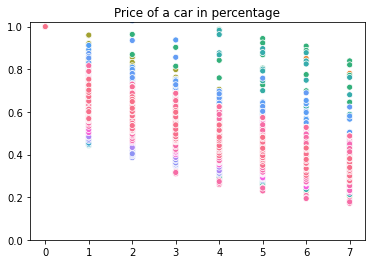

In [4]:
df_years = df[years_since]
d = df_years.transpose()
ax = sns.scatterplot(data=d, markers=False, legend=False)
ax.set(ylim=(0, 1.02))
ax.set_title('Price of a car in percentage')

# df_years[df_years[3] > 0.8]
pass

## Check outlayers

In [5]:
df[(df[years_since] > 1).any(axis=1)]

,Unnamed: 0,model,kw,mark,0,1,2,3,4,5,6,7
5131,5131,911 R (991),368,Porsche,1.0,1.599101,1.461138,NaN,NaN,NaN,NaN,NaN
5136,5136,911 Turbo S Coupé Exclusive Series PDK (991),446,Porsche,1.0,1.310233,NaN,NaN,NaN,NaN,NaN,NaN
5137,5137,911 GT2 RS PDK (991),515,Porsche,1.0,1.356146,NaN,NaN,NaN,NaN,NaN,NaN
5174,5174,Boxster Spyder (981),276,Porsche,1.0,NaN,1.027581,0.93752,NaN,NaN,NaN,NaN


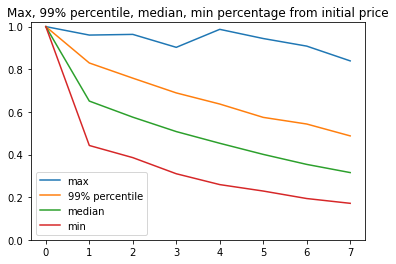

In [6]:
# Removing outlayers
def remove_outlayers(df):
    return df[((df[years_since] <= 1.0) | (pd.isna(df[years_since]))).all(axis=1)]

df_years = remove_outlayers(df_years)

def plot_basic_stat(df):
    ax = sns.lineplot(data=df.max(), markers=True)
    ax = sns.lineplot(data=df.quantile(0.99), markers=True)
    ax = sns.lineplot(data=df.median(), markers=True, ax=ax)
    ax = sns.lineplot(data=df.min(), markers=True, ax=ax)
    ax.legend(['max', '99% percentile', 'median', 'min'])
    ax.set(ylim=(0, 1.02))
    ax.set_title('Max, 99% percentile, median, min percentage from initial price')

plot_basic_stat(df_years)

In [7]:
def get_df_stats(df):
    stats_df = pd.DataFrame()
    stats_df['max'] = df.max()
    stats_df['percentile 99%'] = df.quantile(0.99)
    stats_df['median'] = df.median()
    stats_df['min'] = df.min()
    return stats_df.transpose()

get_df_stats(df_years)

,0,1,2,3,4,5,6,7
max,1.0,0.960366,0.963567,0.902844,0.987261,0.944174,0.908580,0.839266
percentile 99%,1.0,0.829476,0.758304,0.689027,0.636880,0.574291,0.543147,0.487426
median,1.0,0.650734,0.575257,0.507648,0.452790,0.400666,0.353728,0.315308
min,1.0,0.442449,0.385468,0.309843,0.258949,0.228747,0.193571,0.171141


## Plotting per mark

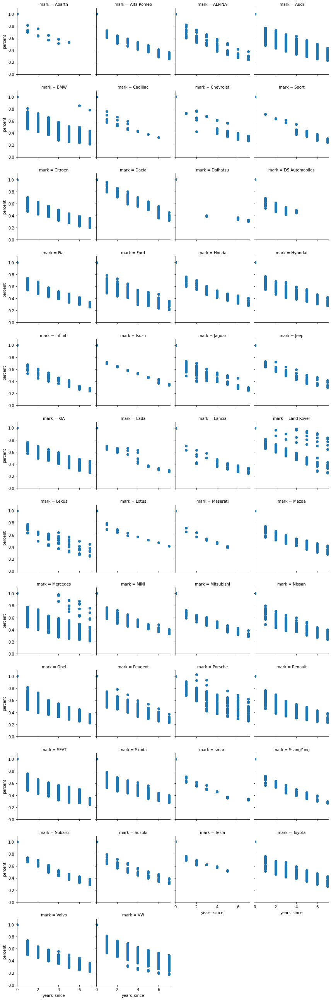

In [8]:
d = []
for i, row in df.iterrows():
    for year in years_since:
        if not pd.isna(row[year]):
            d.append({
                'mark': row['mark'],
                'years_since': year,
                'percent': row[year],
            })

ndf = pd.DataFrame(d)

g = sns.FacetGrid(ndf, col="mark", col_wrap=4)
g.map(plt.scatter, 'years_since', 'percent').set(ylim=(0, 1.1), xlim=(0, 7.1))

[(0.0, 1.75)]

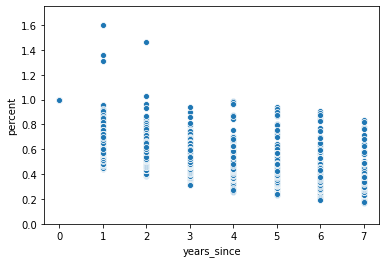

In [9]:
ax = sns.scatterplot(x='years_since', y='percent', data=ndf)
ax.set(ylim=(0, 1.75))

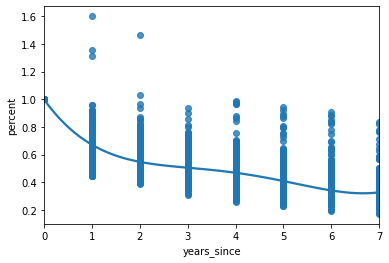

In [10]:

ax = sns.regplot(x='years_since',y='percent', data=ndf, order=4)
# ax.set(ylim=(0, 1.1), xlim=(0, 7.1))
pass

ms.py:85: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/home/kirill/workspace/PycharmProjects/auto/.venv/lib/python3.8/site-packages/seaborn/algorithms.py:85: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/home/kirill/workspace/PycharmProjects/auto/.venv/lib/python3.8/site-packages/seaborn/algorithms.py:85: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/home/kirill/workspace/PycharmProjects/auto/.venv/lib/python3.8/site-packages/seaborn/algorithms.py:85: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/home/kirill/workspace/PycharmProjects/auto/.venv/lib/python3.8/site-packages/seaborn/algorithms.py:85: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/home/kirill/workspace/PycharmProjects/auto/.venv/lib/python3.8/site-packages/seaborn/algorithms.py:85: RankW

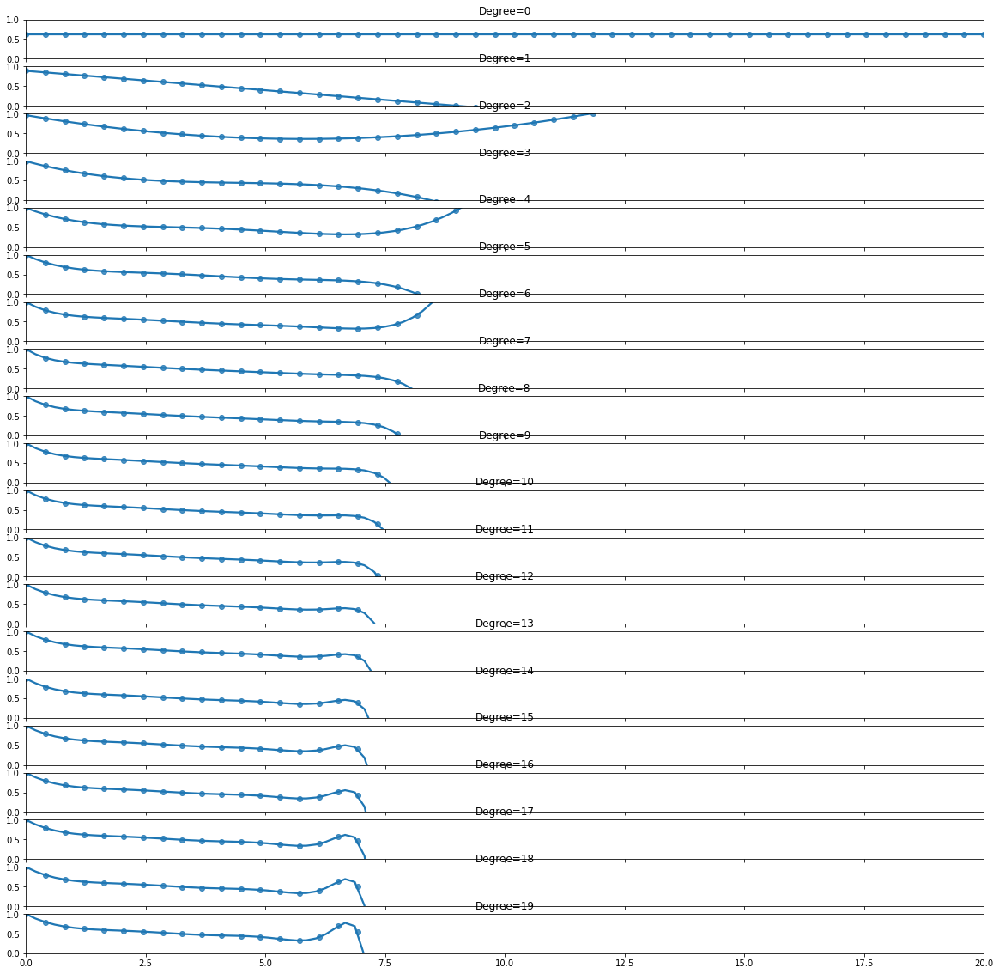

In [11]:
fig, ax = plt.subplots(20, 1, sharey=True, sharex=True)
fig.set_figwidth(20)
fig.set_figheight(20)

X = ndf['years_since']
Y = ndf['percent']

for i in range(0, 20):
    f = np.polyfit(X, Y, i)
    pd = np.poly1d(f)
    
    # row = int(i / 5)
    # col = i % 5
    axi = ax[i]
    axi.set_ylim(0,1)
    # axi.set_xlim(0, 3500)
    x = np.linspace(0, 20)
    y = pd(x)
    sns.regplot(x=x, y=y, order=i, ax=axi).set_title("Degree={}".format(i))
    # break

